In [7]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np
import pyproj
import folium
import matplotlib.cm as cm
from rasterio.transform import from_origin
import pandas as pd
from tqdm import tqdm
import matplotlib
from rasterio.warp import transform_bounds

In [5]:
def decoupe_raster(path, output_filename, haut, bas, gauche, droite) :
      #ouverture du fichier et récupération des infos
    with rasterio.open(path)  as data:
        band1 = data.read(1)
        crs= data.crs
        bounds = data.bounds
        dtype = data.dtypes[0]
        count= data.count
        no_data = data.nodata
        resolution_x = data.res[0]  
        resolution_y = data.res[1]
        transform = data.transform
        ville = band1[haut:bas, gauche:droite]

    #calcul des nouvelles bounds
        window = rasterio.windows.Window(gauche, haut, ville.shape[1], ville.shape[0]) 
        # Calculez les bounds de la sous-image  en utilisant le transform
        sub_image_bounds = rasterio.windows.bounds(window, transform=transform)  
        print(sub_image_bounds)
    #définition du nouveau transform
    top_left_x = sub_image_bounds[0]
    top_left_y = sub_image_bounds[3]
    new_transform = from_origin(top_left_x, top_left_y, resolution_x, resolution_y)
    print(new_transform)

    #enregirstement du raster découper
    with rasterio.open(output_filename, 'w', driver='GTiff', width=ville.shape[1], height=ville.shape[0], count=count, dtype=dtype, transform=new_transform, crs=crs, bounds=sub_image_bounds, nodata=no_data) as dst:
        dst.write(ville, 1)

In [3]:
image_paths = [
    '../Données temp originales/temp_1.TIF',
    '../Données temp originales/temp_2.TIF',
    '../Données temp originales/temp_3.TIF',
    '../Rouen/LC08_L1TP_200026_20220719_20220726_02_T1_B10.TIF',
    '../Données temp originales/temp_7.TIF',
    '../Rouen/Rouen/LC08_L1TP_200026_20130710_20200912_02_T1_B10.TIF',
    '../Rouen/Rouen/LC08_L1TP_200026_20150716_20200908_02_T1_B10.TIF',
    '../Rouen/Rouen/LC08_L1TP_200026_20220719_20220726_02_T1_B10.TIF',
    '../Rouen/Rouen/LC09_L1TP_200026_20220812_20230402_02_T1_B10.TIF',
    '../../dataset_PPI_FAPAR_Rouen/Results/WEKEO/VI_20230607T105621_S2A_T30UYV-010m_V101_FAPAR.tif',
    '../../dataset_PPI_FAPAR_Rouen/Results/WEKEO/VI_20230607T105621_S2A_T30UYV-010m_V101_PPI.tif'
]

In [1]:
file_names = [
    'temp1_LH.tif',
    'temp2_LH.tif',
    'temp3_LH.tif',
    'temp4_LH.tif',
    'temp5_LH.tif',
    'temp6_LH.tif',
    'temp7_LH.tif',
    'temp8_LH.tif',
    'temp9_LH.tif',
    'PPI_LH.tif',
    'FAPAR_LH.tif'
]

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 8001, 'height': 8101, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 219285.0,
       0.0, -30.0, 5535915.0)}
BoundingBox(left=219285.0, bottom=5292885.0, right=459315.0, top=5535915.0)


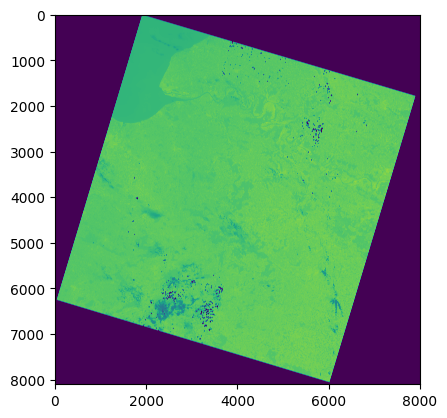

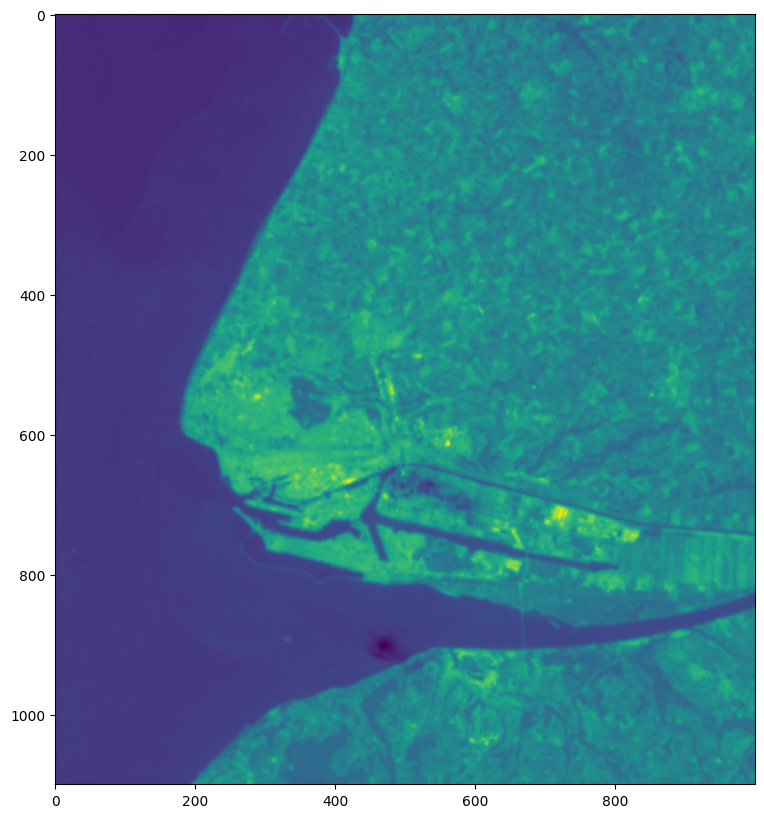

<Axes: >

In [10]:
i = 0
with rasterio.open(image_paths[i])  as data:
    band1 = data.read(1)
    print(data.meta)
    print(data.bounds)
    show(band1)

# coordonée temp
haut = 1000
bas = 2100
gauche = 2100
droite = 3100
nom_du_raster =file_names[i]
plt.figure(figsize=(10,10))
show(band1[haut:bas, gauche:droite])

(282285.0, 5472915.0, 312285.0, 5505915.0)
| 30.00, 0.00, 282285.00|
| 0.00,-30.00, 5505915.00|
| 0.00, 0.00, 1.00|
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 1000, 'height': 1100, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 282285.0,
       0.0, -30.0, 5505915.0)}
EPSG:32631
BoundingBox(left=282285.0, bottom=5472915.0, right=312285.0, top=5505915.0)


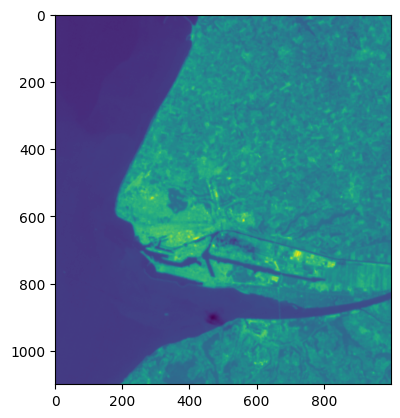

In [12]:
decoupe_raster(image_paths[i], nom_du_raster, haut, bas, gauche, droite)
with rasterio.open(nom_du_raster)  as data:
    print(data.meta)
    print(data.crs)
    print(data.bounds)
    band1=data.read(1)
    show(band1)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 8001, 'height': 8101, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 220485.0,
       0.0, -30.0, 5535915.0)}
BoundingBox(left=220485.0, bottom=5292885.0, right=460515.0, top=5535915.0)


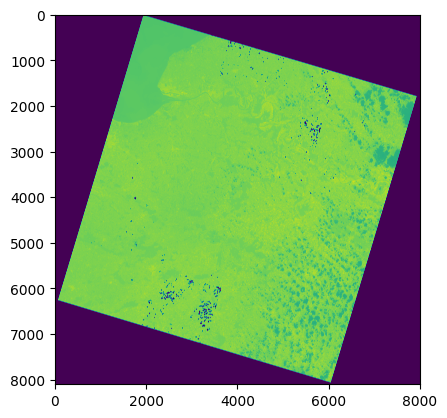

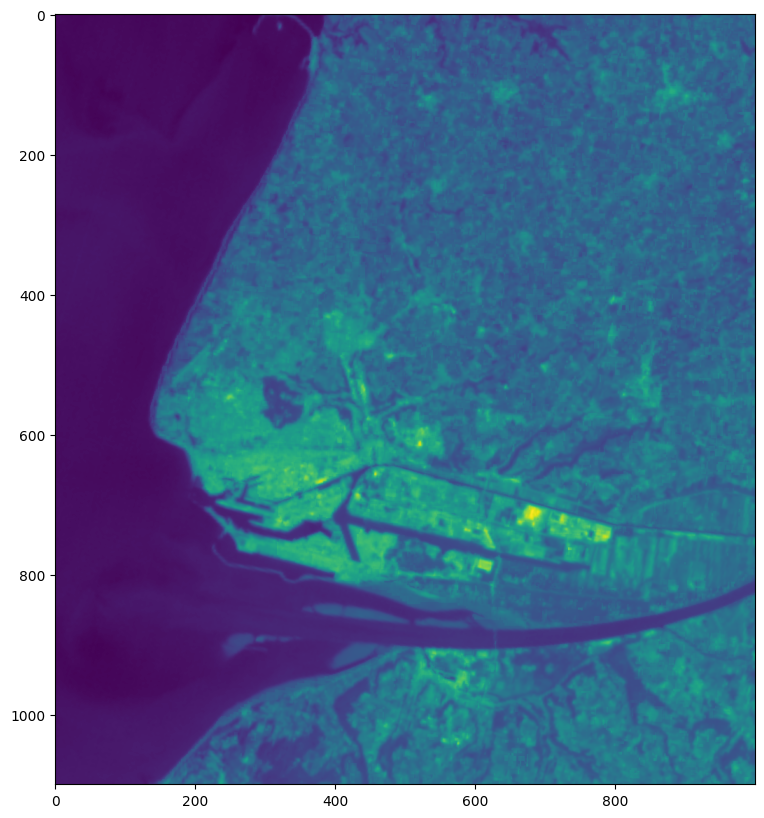

<Axes: >

In [13]:
i = 1
with rasterio.open(image_paths[i])  as data:
    band1 = data.read(1)
    print(data.meta)
    print(data.bounds)
    show(band1)

# coordonée temp
haut = 1000
bas = 2100
gauche = 2100
droite = 3100
nom_du_raster =file_names[i]
plt.figure(figsize=(10,10))
show(band1[haut:bas, gauche:droite])

(283485.0, 5472915.0, 313485.0, 5505915.0)
| 30.00, 0.00, 283485.00|
| 0.00,-30.00, 5505915.00|
| 0.00, 0.00, 1.00|
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 1000, 'height': 1100, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 283485.0,
       0.0, -30.0, 5505915.0)}
EPSG:32631
BoundingBox(left=283485.0, bottom=5472915.0, right=313485.0, top=5505915.0)


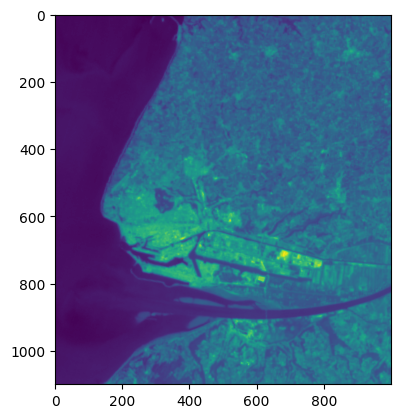

In [14]:
decoupe_raster(image_paths[i], nom_du_raster, haut, bas, gauche, droite)
with rasterio.open(nom_du_raster)  as data:
    print(data.meta)
    print(data.crs)
    print(data.bounds)
    band1=data.read(1)
    show(band1)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 8001, 'height': 8101, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 219585.0,
       0.0, -30.0, 5535915.0)}
BoundingBox(left=219585.0, bottom=5292885.0, right=459615.0, top=5535915.0)


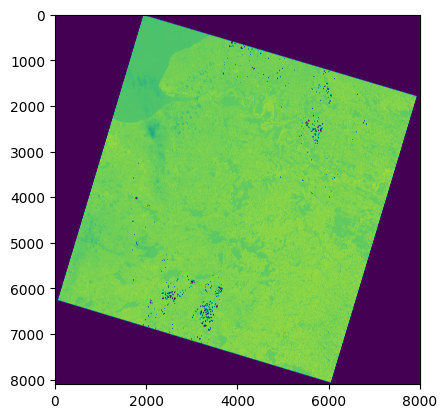

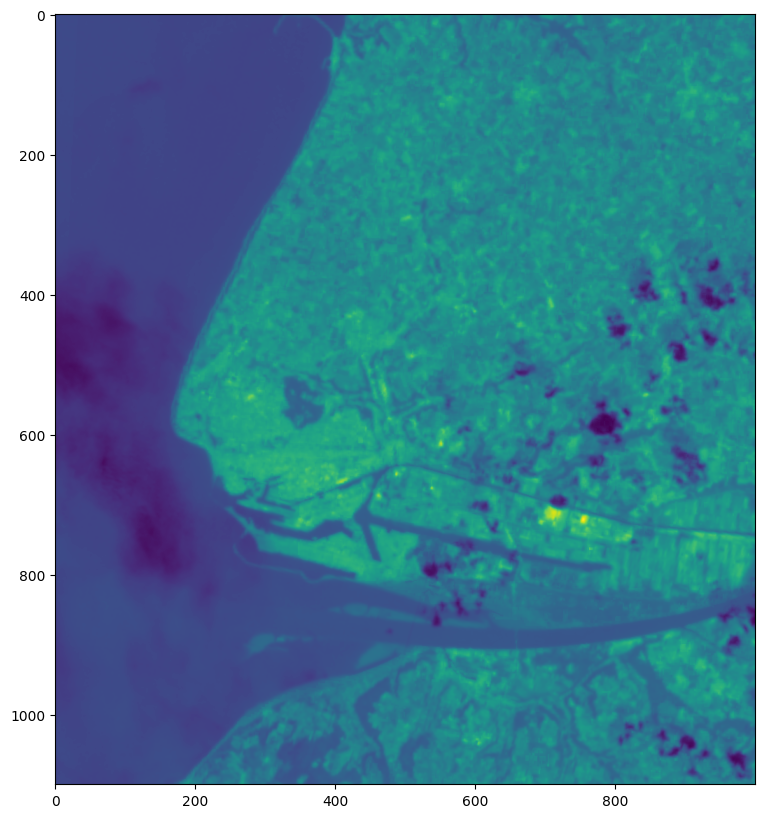

<Axes: >

In [15]:
##Image non retenu !

i = 2
with rasterio.open(image_paths[i])  as data:
    band1 = data.read(1)
    print(data.meta)
    print(data.bounds)
    show(band1)

# coordonée temp
haut = 1000
bas = 2100
gauche = 2100
droite = 3100
nom_du_raster =file_names[i]
plt.figure(figsize=(10,10))
show(band1[haut:bas, gauche:droite])

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 8001, 'height': 8101, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 219285.0,
       0.0, -30.0, 5535915.0)}
BoundingBox(left=219285.0, bottom=5292885.0, right=459315.0, top=5535915.0)


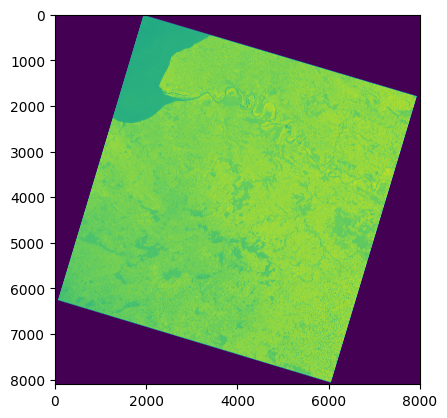

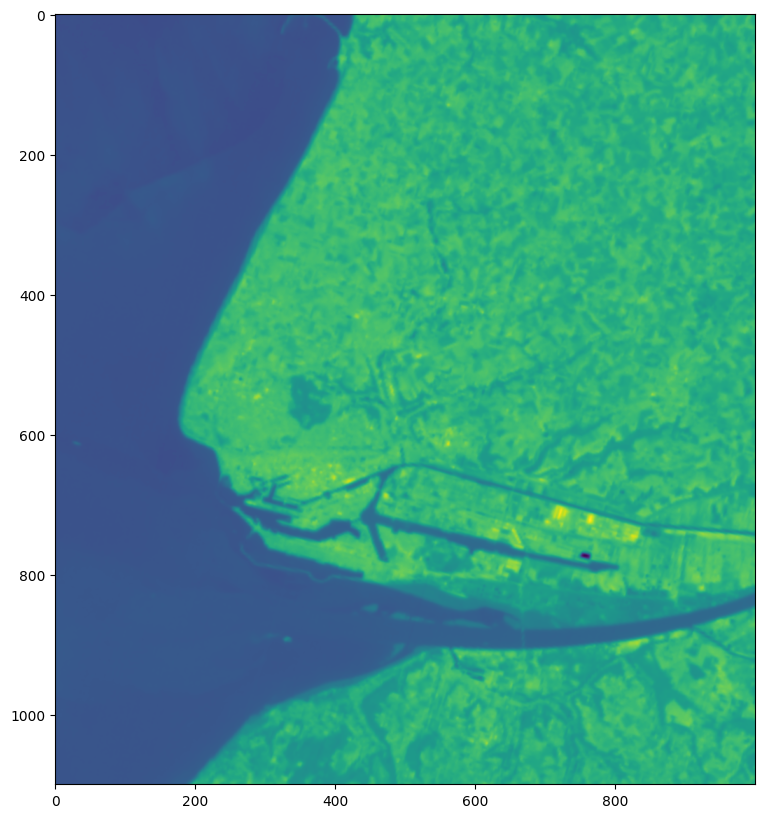

<Axes: >

In [16]:
i = 3
with rasterio.open(image_paths[i])  as data:
    band1 = data.read(1)
    print(data.meta)
    print(data.bounds)
    show(band1)

# coordonée temp
haut = 1000
bas = 2100
gauche = 2100
droite = 3100
nom_du_raster =file_names[i]
plt.figure(figsize=(10,10))
show(band1[haut:bas, gauche:droite])

(282285.0, 5472915.0, 312285.0, 5505915.0)
| 30.00, 0.00, 282285.00|
| 0.00,-30.00, 5505915.00|
| 0.00, 0.00, 1.00|
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 1000, 'height': 1100, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 282285.0,
       0.0, -30.0, 5505915.0)}
EPSG:32631
BoundingBox(left=282285.0, bottom=5472915.0, right=312285.0, top=5505915.0)


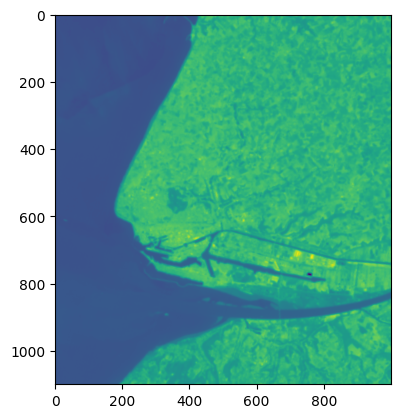

In [17]:
decoupe_raster(image_paths[i], nom_du_raster, haut, bas, gauche, droite)
with rasterio.open(nom_du_raster)  as data:
    print(data.meta)
    print(data.crs)
    print(data.bounds)
    band1=data.read(1)
    show(band1)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 8011, 'height': 8101, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 218685.0,
       0.0, -30.0, 5535915.0)}
BoundingBox(left=218685.0, bottom=5292885.0, right=459015.0, top=5535915.0)


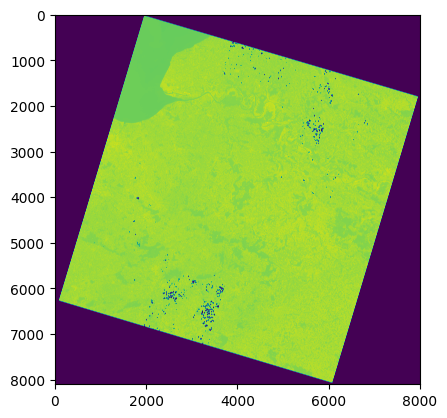

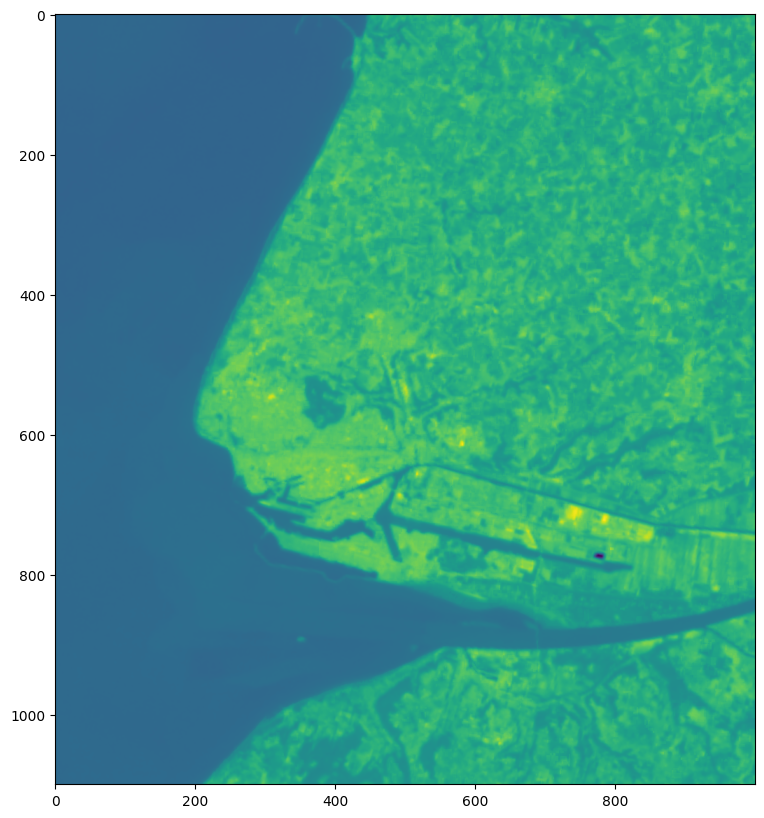

<Axes: >

In [18]:
i = 4
with rasterio.open(image_paths[i])  as data:
    band1 = data.read(1)
    print(data.meta)
    print(data.bounds)
    show(band1)

# coordonée temp
haut = 1000
bas = 2100
gauche = 2100
droite = 3100
nom_du_raster =file_names[i]
plt.figure(figsize=(10,10))
show(band1[haut:bas, gauche:droite])

(281685.0, 5472915.0, 311685.0, 5505915.0)
| 30.00, 0.00, 281685.00|
| 0.00,-30.00, 5505915.00|
| 0.00, 0.00, 1.00|
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 1000, 'height': 1100, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 281685.0,
       0.0, -30.0, 5505915.0)}
EPSG:32631
BoundingBox(left=281685.0, bottom=5472915.0, right=311685.0, top=5505915.0)


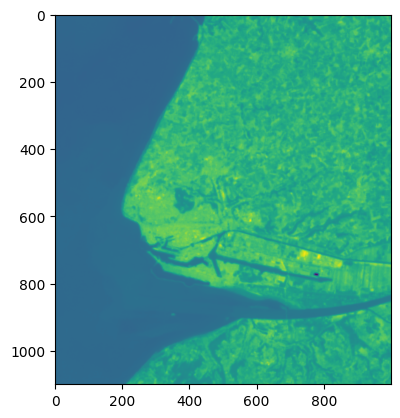

In [19]:
decoupe_raster(image_paths[i], nom_du_raster, haut, bas, gauche, droite)
with rasterio.open(nom_du_raster)  as data:
    print(data.meta)
    print(data.crs)
    print(data.bounds)
    band1=data.read(1)
    show(band1)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 8001, 'height': 8101, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 218685.0,
       0.0, -30.0, 5535915.0)}
BoundingBox(left=218685.0, bottom=5292885.0, right=458715.0, top=5535915.0)


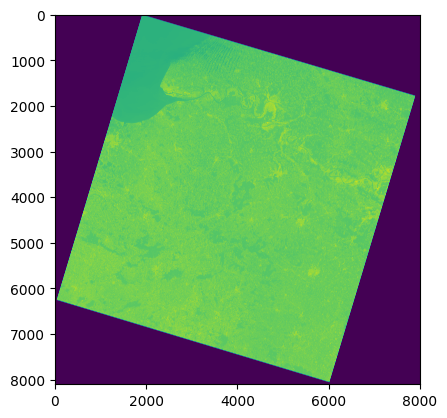

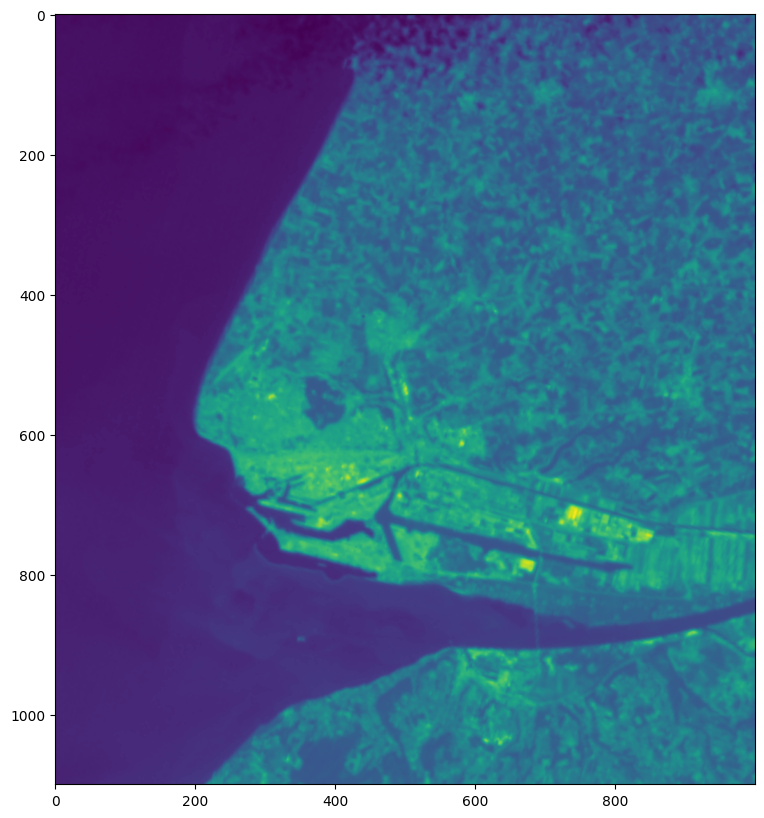

<Axes: >

In [20]:
i = 5
with rasterio.open(image_paths[i])  as data:
    band1 = data.read(1)
    print(data.meta)
    print(data.bounds)
    show(band1)

# coordonée temp
haut = 1000
bas = 2100
gauche = 2100
droite = 3100
nom_du_raster =file_names[i]
plt.figure(figsize=(10,10))
show(band1[haut:bas, gauche:droite])

(281685.0, 5472915.0, 311685.0, 5505915.0)
| 30.00, 0.00, 281685.00|
| 0.00,-30.00, 5505915.00|
| 0.00, 0.00, 1.00|
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 1000, 'height': 1100, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 281685.0,
       0.0, -30.0, 5505915.0)}
EPSG:32631
BoundingBox(left=281685.0, bottom=5472915.0, right=311685.0, top=5505915.0)


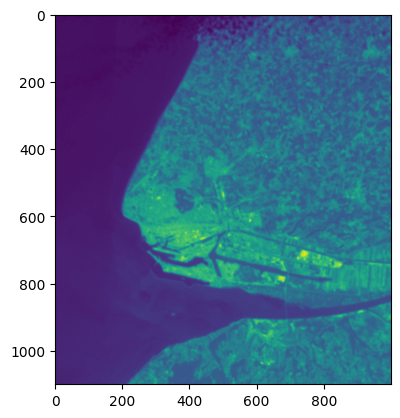

In [21]:
decoupe_raster(image_paths[i], nom_du_raster, haut, bas, gauche, droite)
with rasterio.open(nom_du_raster)  as data:
    print(data.meta)
    print(data.crs)
    print(data.bounds)
    band1=data.read(1)
    show(band1)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 8001, 'height': 8101, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 219285.0,
       0.0, -30.0, 5535915.0)}
BoundingBox(left=219285.0, bottom=5292885.0, right=459315.0, top=5535915.0)


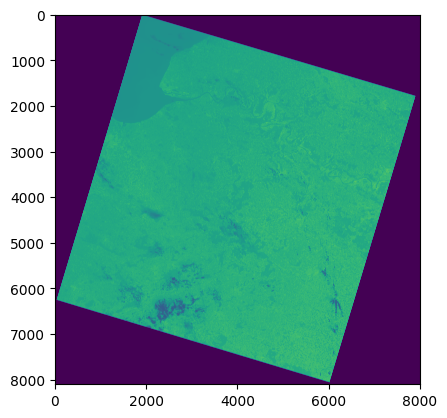

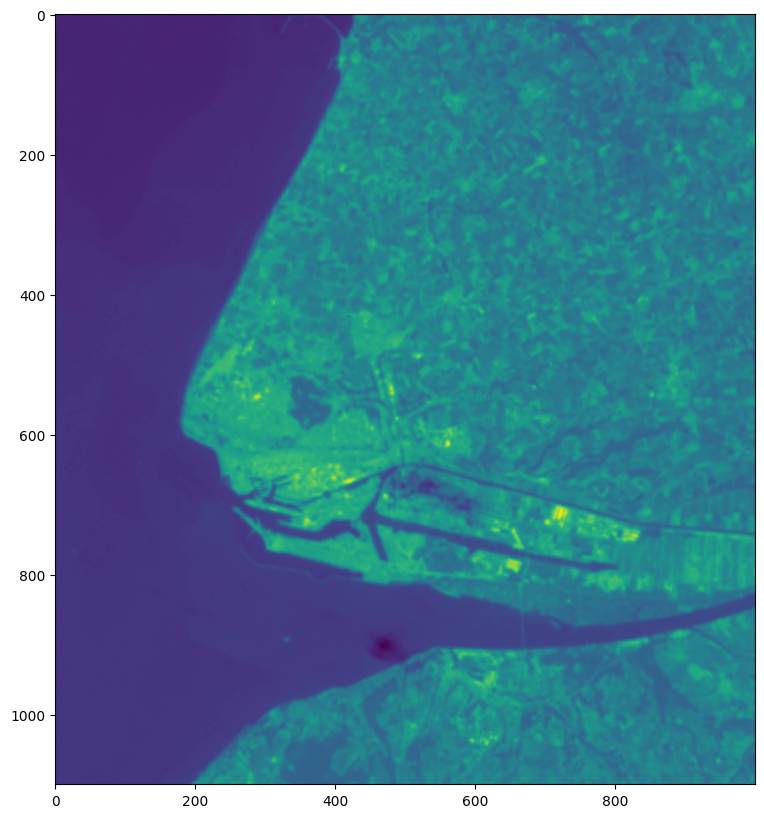

<Axes: >

In [22]:
i = 6
with rasterio.open(image_paths[i])  as data:
    band1 = data.read(1)
    print(data.meta)
    print(data.bounds)
    show(band1)

# coordonée temp
haut = 1000
bas = 2100
gauche = 2100
droite = 3100
nom_du_raster =file_names[i]
plt.figure(figsize=(10,10))
show(band1[haut:bas, gauche:droite])

(282285.0, 5472915.0, 312285.0, 5505915.0)
| 30.00, 0.00, 282285.00|
| 0.00,-30.00, 5505915.00|
| 0.00, 0.00, 1.00|
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 1000, 'height': 1100, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 282285.0,
       0.0, -30.0, 5505915.0)}
EPSG:32631
BoundingBox(left=282285.0, bottom=5472915.0, right=312285.0, top=5505915.0)


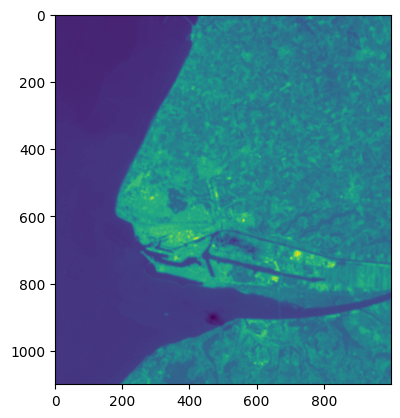

In [23]:
decoupe_raster(image_paths[i], nom_du_raster, haut, bas, gauche, droite)
with rasterio.open(nom_du_raster)  as data:
    print(data.meta)
    print(data.crs)
    print(data.bounds)
    band1=data.read(1)
    show(band1)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 8001, 'height': 8101, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 219285.0,
       0.0, -30.0, 5535915.0)}
BoundingBox(left=219285.0, bottom=5292885.0, right=459315.0, top=5535915.0)


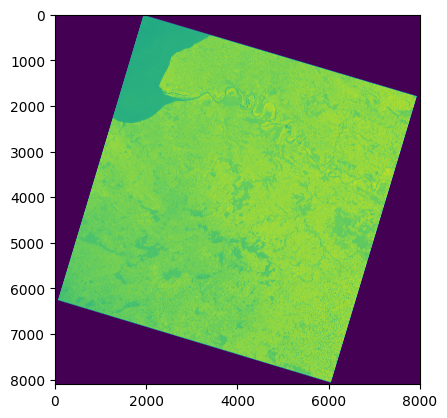

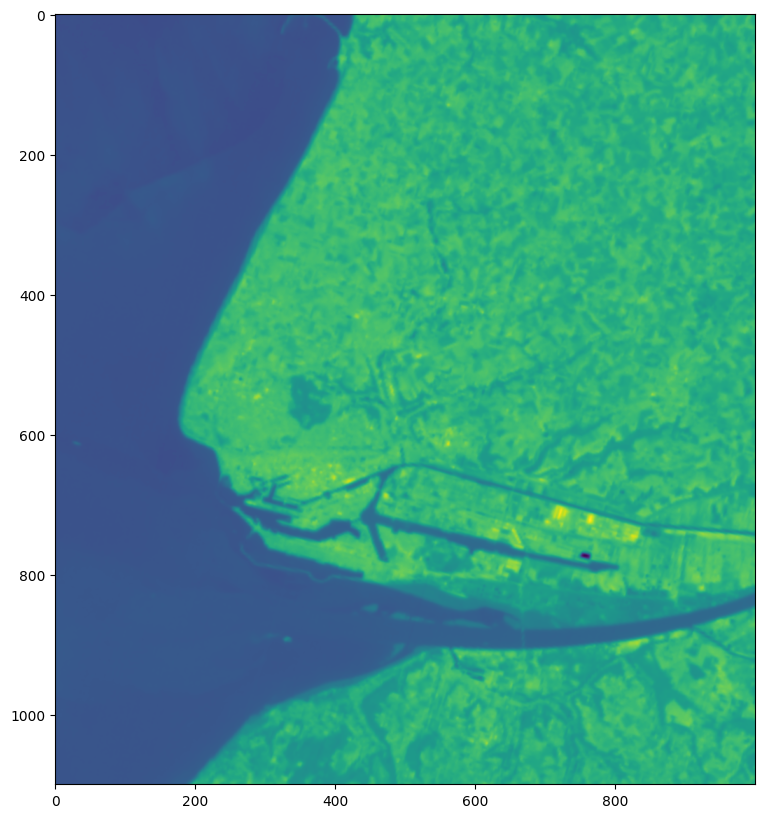

<Axes: >

In [24]:
i = 7
with rasterio.open(image_paths[i])  as data:
    band1 = data.read(1)
    print(data.meta)
    print(data.bounds)
    show(band1)

# coordonée temp
haut = 1000
bas = 2100
gauche = 2100
droite = 3100
nom_du_raster =file_names[i]
plt.figure(figsize=(10,10))
show(band1[haut:bas, gauche:droite])

(282285.0, 5472915.0, 312285.0, 5505915.0)
| 30.00, 0.00, 282285.00|
| 0.00,-30.00, 5505915.00|
| 0.00, 0.00, 1.00|
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 1000, 'height': 1100, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 282285.0,
       0.0, -30.0, 5505915.0)}
EPSG:32631
BoundingBox(left=282285.0, bottom=5472915.0, right=312285.0, top=5505915.0)


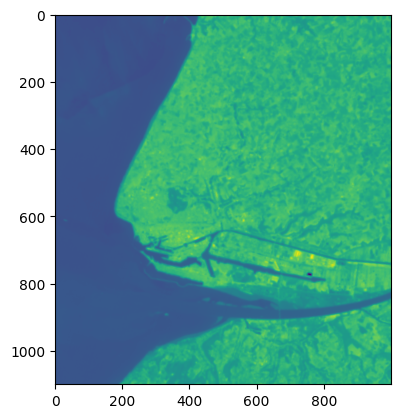

In [25]:
decoupe_raster(image_paths[i], nom_du_raster, haut, bas, gauche, droite)
with rasterio.open(nom_du_raster)  as data:
    print(data.meta)
    print(data.crs)
    print(data.bounds)
    band1=data.read(1)
    show(band1)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 8001, 'height': 8091, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 216585.0,
       0.0, -30.0, 5535915.0)}
BoundingBox(left=216585.0, bottom=5293185.0, right=456615.0, top=5535915.0)


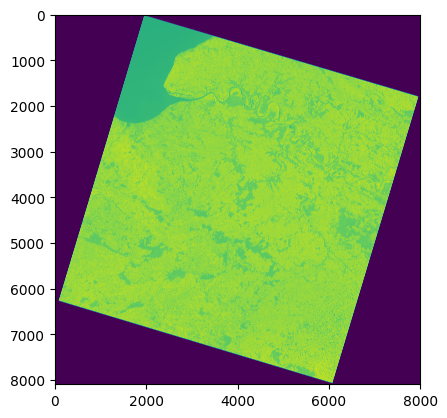

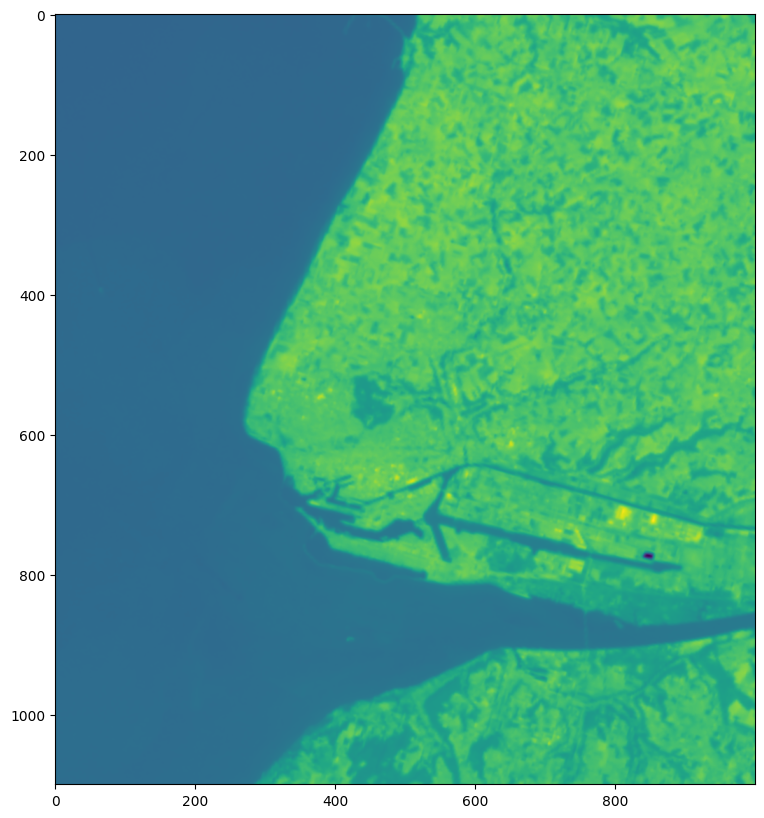

<Axes: >

In [26]:
i = 8
with rasterio.open(image_paths[i])  as data:
    band1 = data.read(1)
    print(data.meta)
    print(data.bounds)
    show(band1)

# coordonée temp
haut = 1000
bas = 2100
gauche = 2100
droite = 3100
nom_du_raster =file_names[i]
plt.figure(figsize=(10,10))
show(band1[haut:bas, gauche:droite])

(279585.0, 5472915.0, 309585.0, 5505915.0)
| 30.00, 0.00, 279585.00|
| 0.00,-30.00, 5505915.00|
| 0.00, 0.00, 1.00|
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 1000, 'height': 1100, 'count': 1, 'crs': CRS.from_epsg(32631), 'transform': Affine(30.0, 0.0, 279585.0,
       0.0, -30.0, 5505915.0)}
EPSG:32631
BoundingBox(left=279585.0, bottom=5472915.0, right=309585.0, top=5505915.0)


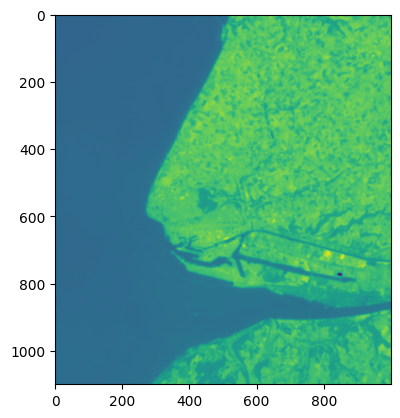

In [27]:
decoupe_raster(image_paths[i], nom_du_raster, haut, bas, gauche, droite)
with rasterio.open(nom_du_raster)  as data:
    print(data.meta)
    print(data.crs)
    print(data.bounds)
    band1=data.read(1)
    show(band1)

{'driver': 'GTiff', 'dtype': 'int16', 'nodata': -32768.0, 'width': 10980, 'height': 10980, 'count': 1, 'crs': CRS.from_epsg(32630), 'transform': Affine(10.0, 0.0, 699960.0,
       0.0, -10.0, 5500020.0)}
BoundingBox(left=699960.0, bottom=5390220.0, right=809760.0, top=5500020.0)


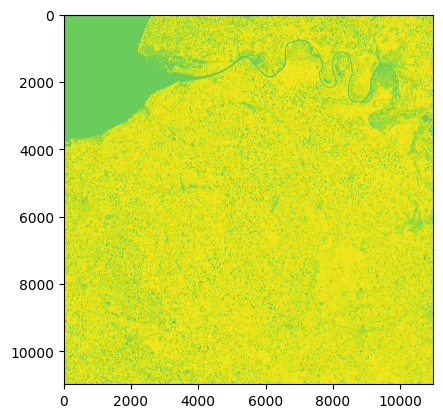

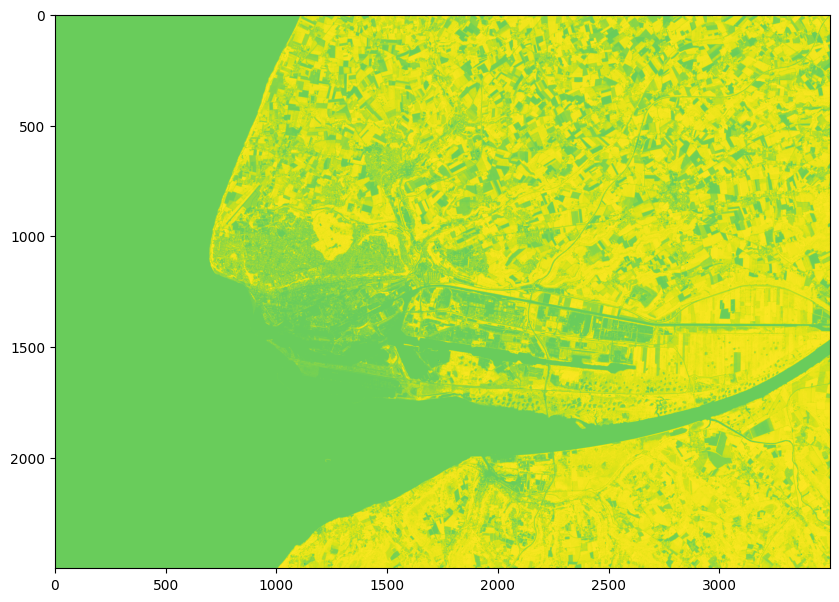

<Axes: >

In [36]:
i = 9
with rasterio.open(image_paths[i])  as data:
    band1 = data.read(1)
    print(data.meta)
    print(data.bounds)
    show(band1)

# coordonée temp
haut = 0
bas = 2500
gauche = 1500
droite = 5000
nom_du_raster =file_names[i]
plt.figure(figsize=(10,10))
show(band1[haut:bas, gauche:droite])

(714960.0, 5475020.0, 749960.0, 5500020.0)
| 10.00, 0.00, 714960.00|
| 0.00,-10.00, 5500020.00|
| 0.00, 0.00, 1.00|
{'driver': 'GTiff', 'dtype': 'int16', 'nodata': -32768.0, 'width': 3500, 'height': 2500, 'count': 1, 'crs': CRS.from_epsg(32630), 'transform': Affine(10.0, 0.0, 714960.0,
       0.0, -10.0, 5500020.0)}
EPSG:32630
BoundingBox(left=714960.0, bottom=5475020.0, right=749960.0, top=5500020.0)


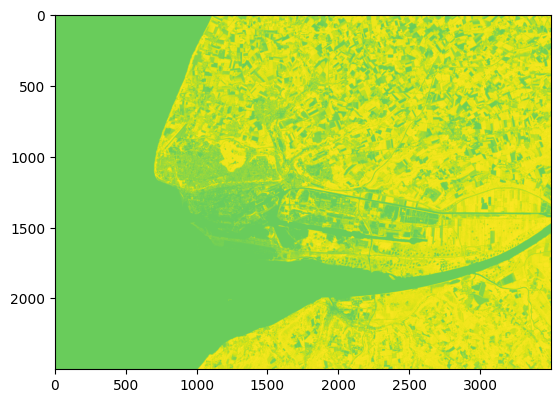

In [37]:
decoupe_raster(image_paths[i], nom_du_raster, haut, bas, gauche, droite)
with rasterio.open(nom_du_raster)  as data:
    print(data.meta)
    print(data.crs)
    print(data.bounds)
    band1=data.read(1)
    show(band1)

{'driver': 'GTiff', 'dtype': 'int16', 'nodata': -32768.0, 'width': 10980, 'height': 10980, 'count': 1, 'crs': CRS.from_epsg(32630), 'transform': Affine(10.0, 0.0, 699960.0,
       0.0, -10.0, 5500020.0)}
BoundingBox(left=699960.0, bottom=5390220.0, right=809760.0, top=5500020.0)


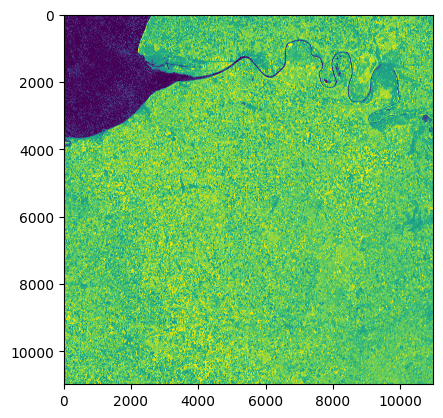

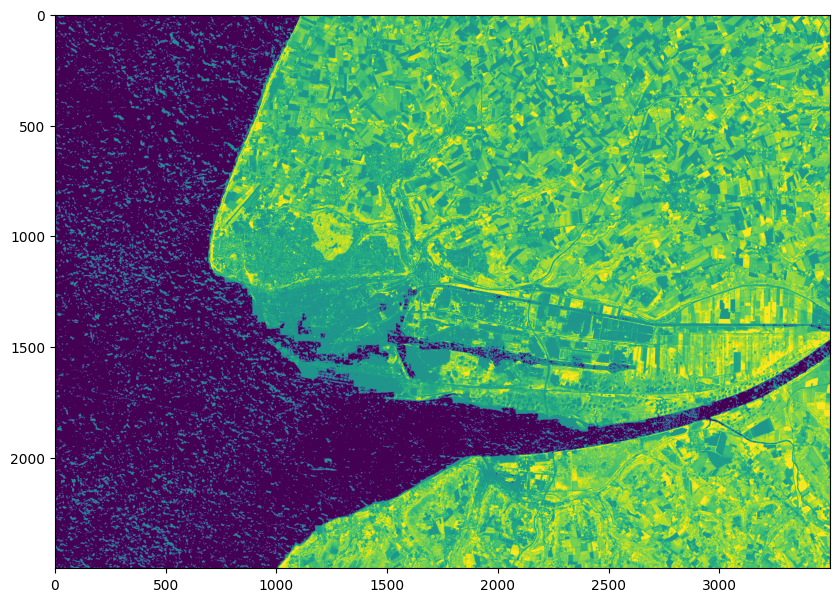

<Axes: >

In [38]:
i = 10
with rasterio.open(image_paths[i])  as data:
    band1 = data.read(1)
    print(data.meta)
    print(data.bounds)
    show(band1)

# coordonée temp
haut = 0
bas = 2500
gauche = 1500
droite = 5000
nom_du_raster =file_names[i]
plt.figure(figsize=(10,10))
show(band1[haut:bas, gauche:droite])

In [ ]:
decoupe_raster(image_paths[i], nom_du_raster, haut, bas, gauche, droite)
with rasterio.open(nom_du_raster)  as data:
    print(data.meta)
    print(data.crs)
    print(data.bounds)
    band1=data.read(1)
    show(band1)

(714960.0, 5475020.0, 749960.0, 5500020.0)
| 10.00, 0.00, 714960.00|
| 0.00,-10.00, 5500020.00|
| 0.00, 0.00, 1.00|
{'driver': 'GTiff', 'dtype': 'int16', 'nodata': -32768.0, 'width': 3500, 'height': 2500, 'count': 1, 'crs': CRS.from_epsg(32630), 'transform': Affine(10.0, 0.0, 714960.0,
       0.0, -10.0, 5500020.0)}
EPSG:32630
BoundingBox(left=714960.0, bottom=5475020.0, right=749960.0, top=5500020.0)
